In [360]:
# Core
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='darkgrid', font_scale=1.4)
from imblearn.over_sampling import SMOTE
import itertools
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import time
from lazypredict.Supervised import LazyClassifier
# Sklearn
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from plotly.subplots import make_subplots
from sklearn.utils import resample

# Models
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import plotly
import plotly.graph_objects as go


In [5]:
%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',100)          # Set now of columns visible to 100
pd.set_option('display.max_rows',100)          # Set now of rows visible to 100
plotly.offline.init_notebook_mode(connected=True)
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), height=500, width=1000))

 <b><span style='color:#DEB078'>|</span><span style='color:#660000'> Features Descriptions</span></b>  

* <b>PassengerId</b> - A unique Id for each passenger. Each Id takes the form gggg_pp where gggg indicates a group the passenger is travelling with and pp is their number within the group. People in a group are often family members, but not always.
* <b>HomePlanet</b> - The planet the passenger departed from, typically their planet of permanent residence.
* <b>CryoSleep</b> - Indicates whether the passenger elected to be put into suspended animation for the duration of the voyage. Passengers in cryosleep are confined to their cabins.
* <b>Cabin</b> - The cabin number where the passenger is staying. Takes the form deck/num/side, where side can be either P for Port or S for Starboard.
* <b>Destination</b> - The planet the passenger will be debarking to.
* <b>Age</b> - The age of the passenger.
* <b>VIP</b> - Whether the passenger has paid for special VIP service during the voyage.
* <b>RoomService, FoodCourt, ShoppingMall, Spa, VRDeck</b> - Amount the passenger has billed at each of the Spaceship Titanic's many luxury amenities.
* <b>Name</b> - The first and last names of the passenger.
* <b>Transported</b> - Whether the passenger was transported to another dimension. This is the target, the column you are trying to predict.

<div style="padding:20px;color:#ff6f3c;margin:0;font-size:300%;text-align:center;display:fill;border-radius:5px;background-color:#155263;overflow:hidden;font-weight:800">🚀 Spaceship Titanic 🚀</div>

 <b><div style='padding:15px;background-color:#800000;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>Importing Data</div></b>



* Content 
    * Importing Train Data
    * Importing Test Data
   
    

In [6]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')

In [7]:
train.nunique().values

array([8693,    3,    2, 6560,    3,   80,    2, 1273, 1507, 1115, 1327,
       1306, 8473,    2], dtype=int64)

<b><div style='padding:15px;background-color:#800000;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>1 | Exploratory Data Analysis</div></b>

<b><span style='color:#DEB078'>1.1 |</span><span style='color:#660000'> Check Null Values</span></b>  

In [8]:
def summary(data) :
    df=pd.DataFrame()
    train=data.copy()
    df['Columns']=train.columns
    df['Dtype']=train.dtypes.values
    df['Missing']=train.isnull().sum().values
    df['% Missing']=(df['Missing'])/len(df)
    df['Uniques']=train.nunique().values
    df['% Uniques']=(df['Uniques'])/len(df)
    return df.sort_values(by='% Missing',ascending=False)
    

In [9]:
summary(train)

,Columns,Dtype,Missing,% Missing,Uniques,% Uniques
2,CryoSleep,object,217,15.500000,2,0.142857
9,ShoppingMall,float64,208,14.857143,1115,79.642857
6,VIP,object,203,14.500000,2,0.142857
1,HomePlanet,object,201,14.357143,3,0.214286
12,Name,object,200,14.285714,8473,605.214286
3,Cabin,object,199,14.214286,6560,468.571429
11,VRDeck,float64,188,13.428571,1306,93.285714
8,FoodCourt,float64,183,13.071429,1507,107.642857
10,Spa,float64,183,13.071429,1327,94.785714
4,Destination,object,182,13.000000,3,0.214286


In [10]:
summary(test)

,Columns,Dtype,Missing,% Missing,Uniques,% Uniques
8,FoodCourt,float64,106,8.153846,902,69.384615
10,Spa,float64,101,7.769231,833,64.076923
3,Cabin,object,100,7.692308,3265,251.153846
9,ShoppingMall,float64,98,7.538462,715,55.000000
12,Name,object,94,7.230769,4176,321.230769
2,CryoSleep,object,93,7.153846,2,0.153846
6,VIP,object,93,7.153846,2,0.153846
4,Destination,object,92,7.076923,3,0.230769
5,Age,float64,91,7.000000,79,6.076923
1,HomePlanet,object,87,6.692308,3,0.230769


<b><span style='color:#DEB078'>1.2 |</span><span style='color:#660000'>Splitting Cabin</span></b>  

In [11]:
def split_cabin(data) :
    data['Cabin']=data['Cabin'].fillna('Missing/Missing/Missing')
    data['Deck']=data['Cabin'].str.split('/').apply(lambda x:x[0])
    data['Num']=data['Cabin'].str.split('/').apply(lambda x:x[1])
    data['Side']=data['Cabin'].str.split('/').apply(lambda x:x[2])
 

In [12]:
split_cabin(train)
split_cabin(test)

 <b><span style='color:#DEB078'>1.3 |</span><span style='color:#660000'> Data Distibution</span></b>  

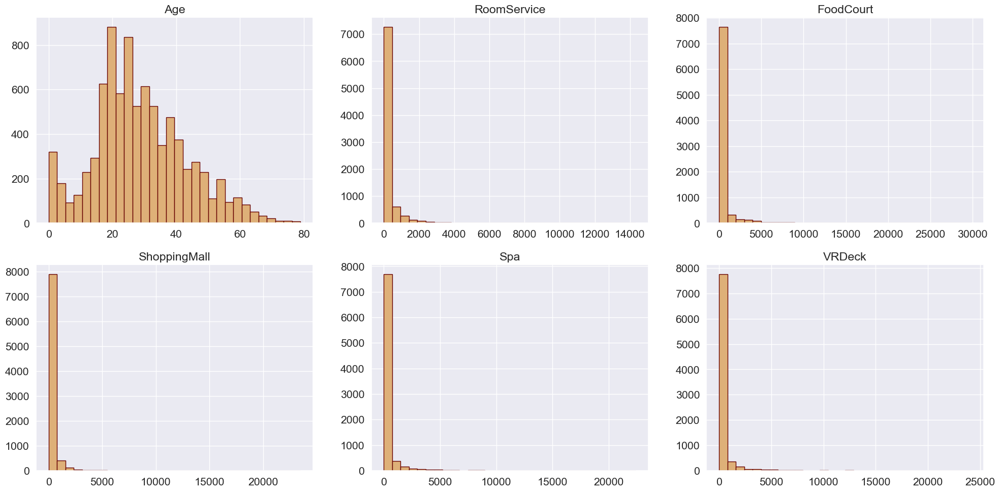

In [13]:
figsize_val=(20,10)
layout_val=(-1, 3)
train.hist(bins=30, figsize=figsize_val, layout=layout_val,color='#DEB078', edgecolor="#660000")

plt.tight_layout();

<b><span style='color:#DEB078'>1.4 |</span><span style='color:#660000'> Check Null Values</span></b>  

In [14]:
def visualizeNull(data) :
    null=pd.Series([feature for feature in data.columns if data[feature].isnull().sum()>=0])
    null_values=pd.Series(data[null].isnull().sum().values)
    full_value=pd.concat([null,null_values],axis=1)
    full_value=full_value.sort_values(by=1,ascending=False)
    plt.figure(figsize=(12,8),dpi=100)
    fig=px.bar(x=full_value[0],y=100*full_value[1]/(len(data)),color_discrete_sequence=['#7c2c15'],title=f'Null Value % {data.name} ',
               labels={'x':'Columns Name','y':'% Missing'})
    fig.show()


In [15]:
train.name='train'

In [16]:
test.name='test'

In [17]:
visualizeNull(train)

<Figure size 1200x800 with 0 Axes>

In [18]:
visualizeNull(test)

<Figure size 1200x800 with 0 Axes>

<b><span style='color:#DEB078'>1.5 |</span><span style='color:#660000'> Unique Values</span></b>  

In [19]:
def plot_unique(data) :
    fig=make_subplots(2,2,subplot_titles=('Unique values per Categorial',"Unique value per Numerical","% Unique Categorial","% Unique Numerical"),shared_xaxes=True,vertical_spacing=0.1)
    cat=data.select_dtypes(exclude='number').nunique().sort_values(ascending=False)
    fig.add_trace(go.Bar(x=cat.index,y=cat.values,marker=dict(color='#7c2c15'),name='Categorial'),row=1,col=1)
    
    num=data.select_dtypes(include='number').nunique().sort_values(ascending=False)
    fig.add_trace(go.Bar(x=num.index,y=num.values,marker=dict(color='#c7771d'),name='Numerical'),row=1,col=2)    
    fig.add_trace(go.Bar(x=cat.index,y=100*cat.values/len(data),marker=dict(color='#7c2c15'),name='Categorial',showlegend=False),row=2,col=1)
    fig.add_trace(go.Bar(x=num.index,y=num.values,marker=dict(color='#c7771d'),name='Numerical',showlegend=False),row=2,col=2)
    fig.update_layout(height=600, width=1000,
                  title_text=f"{data.name} uniques plot")
    fig.show()

In [20]:
plot_unique(train)

<b><span style='color:#DEB078'>1.6 |</span><span style='color:#660000'> Getting Family Names</span></b>  

In [21]:
def family_names(data):
    data['Name']=data['Name'].fillna('Missing Missing')
    data['Last Name']=data['Name'].str.split(' ').apply(lambda x:x[1])

In [22]:
family_names(train)
family_names(test)

<b><span style='color:#DEB078'>1.7 |</span><span style='color:#660000'>Each numerical column plot distribution</span></b>  

In [23]:
def plot_col(data) :
    data.plot(xticks=[],title=f'{data.name} plot',lw=0,marker=".",subplots=True,layout=(-1,3),figsize=(12,8),markersize=6,color='#DEB078')
    
    plt.tight_layout()
    

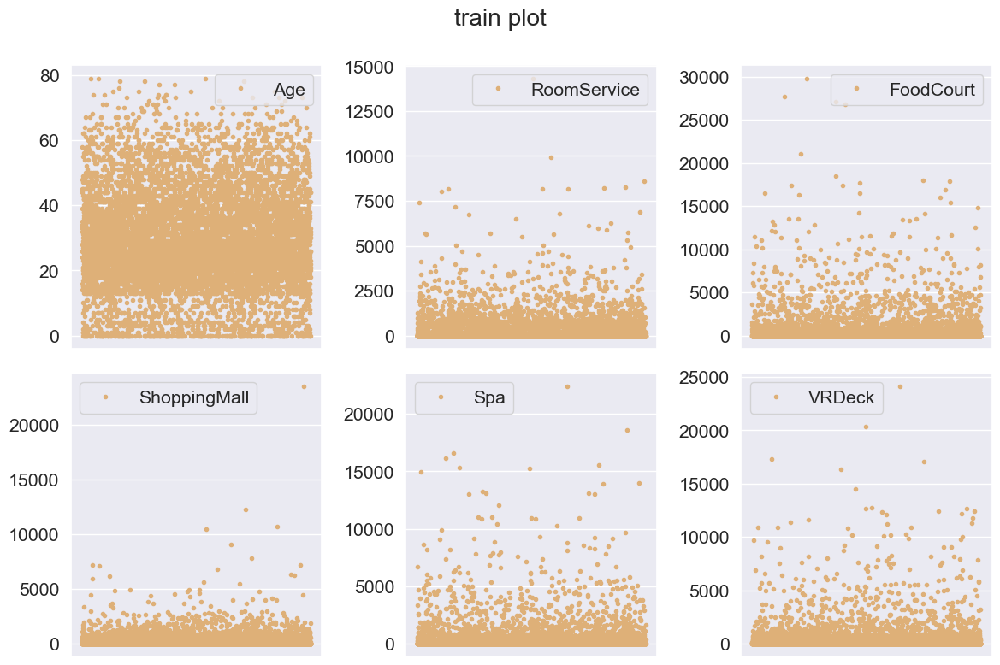

In [24]:
plot_col(train)

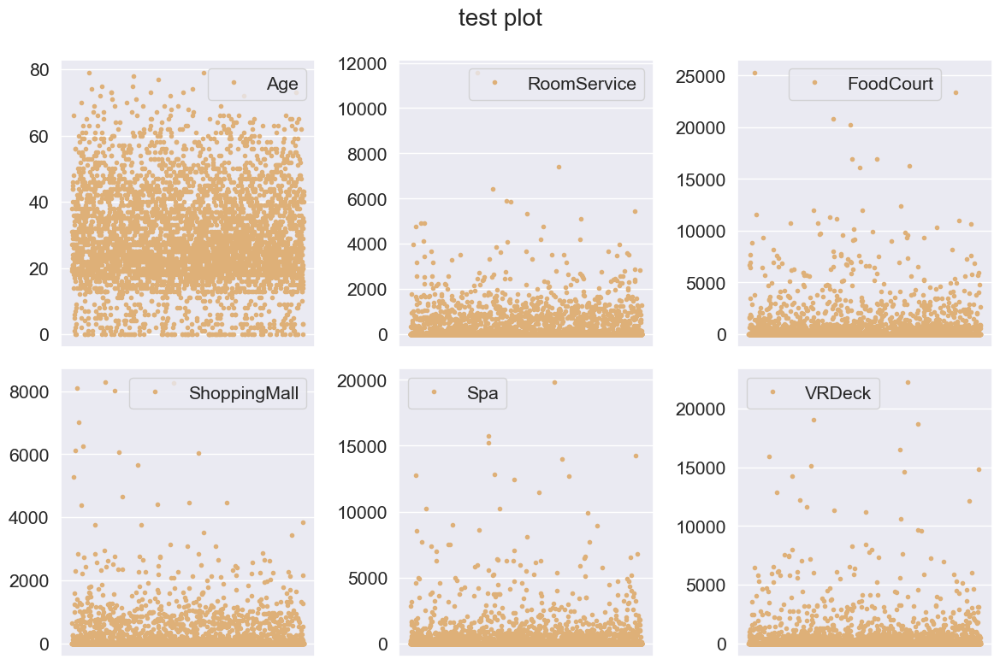

In [25]:
plot_col(test)

<b><span style='color:#DEB078'>1.8 |</span><span style='color:#660000'>Target Value</span></b>  

In [26]:
def target_plot(data) :
    target=data[['Transported']].value_counts(normalize=True).round(decimals=4)*100
    pal,color=['#e69936','#995e13'],['e69936','995e13']
    
    fig=go.Figure()
    fig.add_trace(go.Pie(sort=False,labels=target.index,values=target,hole=.5,marker=dict(colors=color,line=dict(color=pal,width=2.5)),hovertemplate="%{label} Transported : %{value:.2f}%<extra></extra>"))
    fig.update_layout(template=temp,title='Target Distribution',legend=dict(traceorder='reversed',y=1.05,x=0),uniformtext_minsize=15,height=500,uniformtext_mode='hide')
    fig.show()

In [27]:
target_plot(train)

<b><span style='color:#DEB078'>1.9 |</span><span style='color:#660000'>Plotting Categorial Columns</span></b>  

In [28]:
cat_threshold=10
fields=train.select_dtypes(exclude="number").nunique()[train.select_dtypes(exclude="number").nunique() <=cat_threshold].index.tolist()

In [106]:
def plot_cat(data) :
    cat_threshold=10
    fields=data.select_dtypes(exclude="number").nunique()[data.select_dtypes(exclude="number").nunique() <=cat_threshold].index.tolist()
    fig=make_subplots(2,4,vertical_spacing=0.25,subplot_titles=fields)
    count=1
    num=1
    my_categories=pd.CategoricalDtype(categories=['A','B','C','D','E','F','G','T','Missing'], 
                           ordered=True)
    data['Deck']=data['Deck'].astype(my_categories)
    for i,j in enumerate(fields) :
        if count <=4 :
            fig.add_trace(go.Histogram(x=data[j].sort_values(ascending=True),bingroup=''),row=1,col=count)
            count+=1
        else :
            fig.add_trace(go.Histogram(x=data[j].sort_values()),row=2,col=num)
            num+=1
            
            
    fig.update_layout(height=600, width=1000,
                  title_text=f"{data.name} categorial plot",showlegend=False)
    fig.show()
    #px.histogram(train_data, x='Survived', color="Sex", barmode='group')

In [107]:
fields=train.select_dtypes(exclude="number").nunique()[train.select_dtypes(exclude="number").nunique() <=cat_threshold].index.tolist()

In [108]:
train['Deck'].sort_values()

5767          A
2182          A
6048          A
6049          A
6067          A
         ...   
4058    Missing
1049    Missing
6060    Missing
7382    Missing
4929    Missing
Name: Deck, Length: 8693, dtype: category
Categories (9, object): ['A' < 'B' < 'C' < 'D' ... 'F' < 'G' < 'T' < 'Missing']

In [109]:
plot_cat(train)

In [ ]:
plot_cat(test)

<b><span style='color:#DEB078'>1.10 |</span><span style='color:#660000'>Plotting Numerical Columns Against Target</span></b>  

In [34]:
def num_plot(data) :
    numeric=train.select_dtypes(include="number").columns   
    fig=make_subplots(2,3,vertical_spacing=0.25,subplot_titles=numeric)
    num=1
    seal=1
    for i in numeric :
        if num <= 3 :
            fig.add_trace(go.Box(y=data[i],x=data['Transported']),row=1,col=num)
            num+=1
        else :
            fig.add_trace(go.Box(y=data[i],x=data['Transported']),row=2,col=seal)
            seal+=1
    fig.update_layout(height=600, width=1000,
                  title_text=f"{data.name} Numerical plot against Target",showlegend=False)
    fig.show()
            
    

In [35]:
num_plot(train)

<b><span style='color:#DEB078'>1.11 |</span><span style='color:#660000'>Plotting Numerical Columns Against CryoSleep</span></b>  

In [37]:
def num_plotcryo(data) :
    numeric=train.select_dtypes(include="number").columns   
    fig=make_subplots(2,3,vertical_spacing=0.25,subplot_titles=numeric)
    num=1
    seal=1
    for i in numeric :
        if num <= 3 :
            fig.add_trace(go.Box(y=data[i],x=data['CryoSleep']),row=1,col=num)
            num+=1
        else :
            fig.add_trace(go.Box(y=data[i],x=data['CryoSleep']),row=2,col=seal)
            seal+=1
    fig.update_layout(height=600, width=1000,
                  title_text=f"{data.name} Numerical plot against CryoSleep",showlegend=False)
    fig.show()

In [38]:
num_plotcryo(train)

<b><span style='color:#DEB078'>1.12 |</span><span style='color:#660000'>Pair Plot</span></b>  

In [39]:
def pairplot(data) :
    
    if 'Transported' in data.columns :
        plt.figure(figsize=(12,8),dpi=100)
        train2=data.copy()
        train2['CryoSleep']=train2['CryoSleep'].apply(lambda x:1 if True else 0)
        train2['VIP']=train2['VIP'].apply(lambda x:1 if True else 0)
        train2['Transported']=train2['Transported'].apply(lambda x:1 if True else 0)
        sns.pairplot(train2)
    else :
        plt.figure(figsize=(12,8),dpi=100)
        train2=data.copy()
        train2['CryoSleep']=train2['CryoSleep'].apply(lambda x:1 if True else 0)
        train2['VIP']=train2['VIP'].apply(lambda x:1 if True else 0)
        sns.pairplot(train2)
    

In [40]:
train2=train.copy()
train2['CryoSleep']=train2['CryoSleep'].apply(lambda x:1 if True else 0)
train2['VIP']=train2['VIP'].apply(lambda x:1 if True else 0)
train2['Transported']=train2['Transported'].apply(lambda x:1 if True else 0)

<Figure size 1200x800 with 0 Axes>

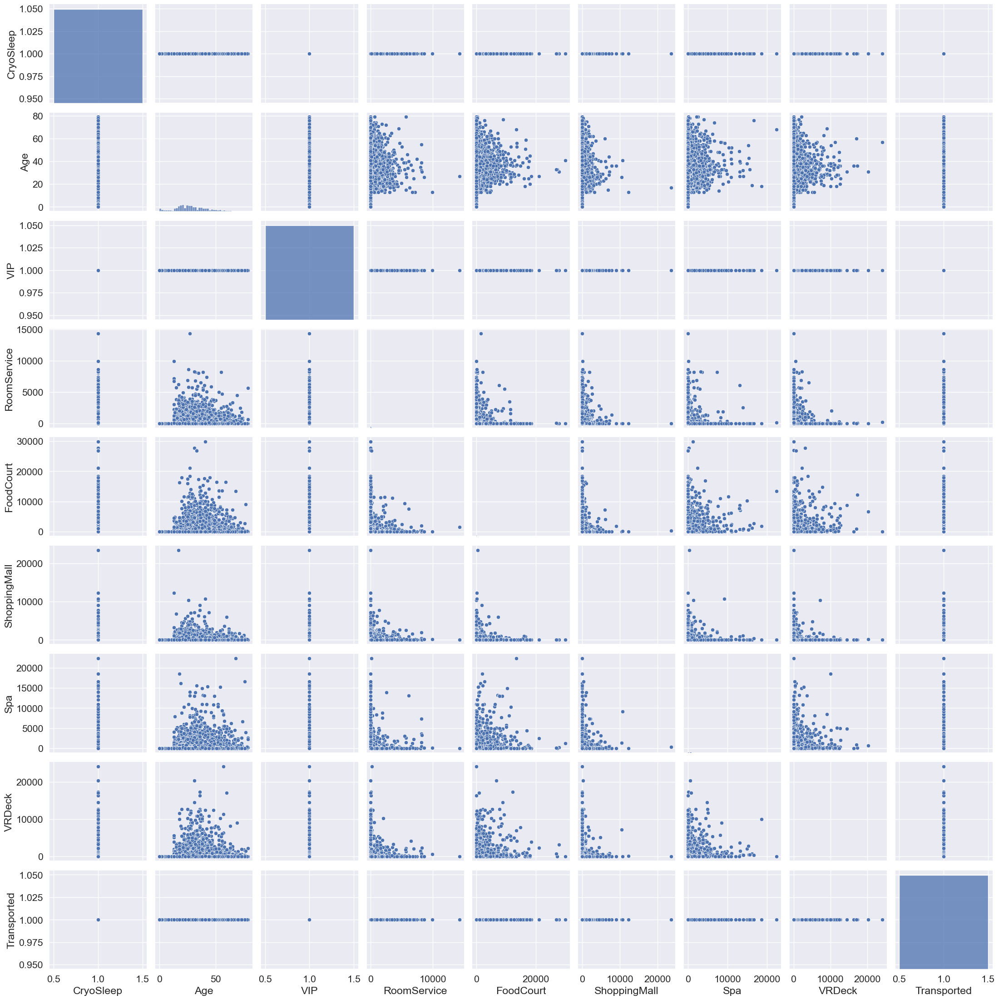

In [41]:
pairplot(train)

<Figure size 1200x800 with 0 Axes>

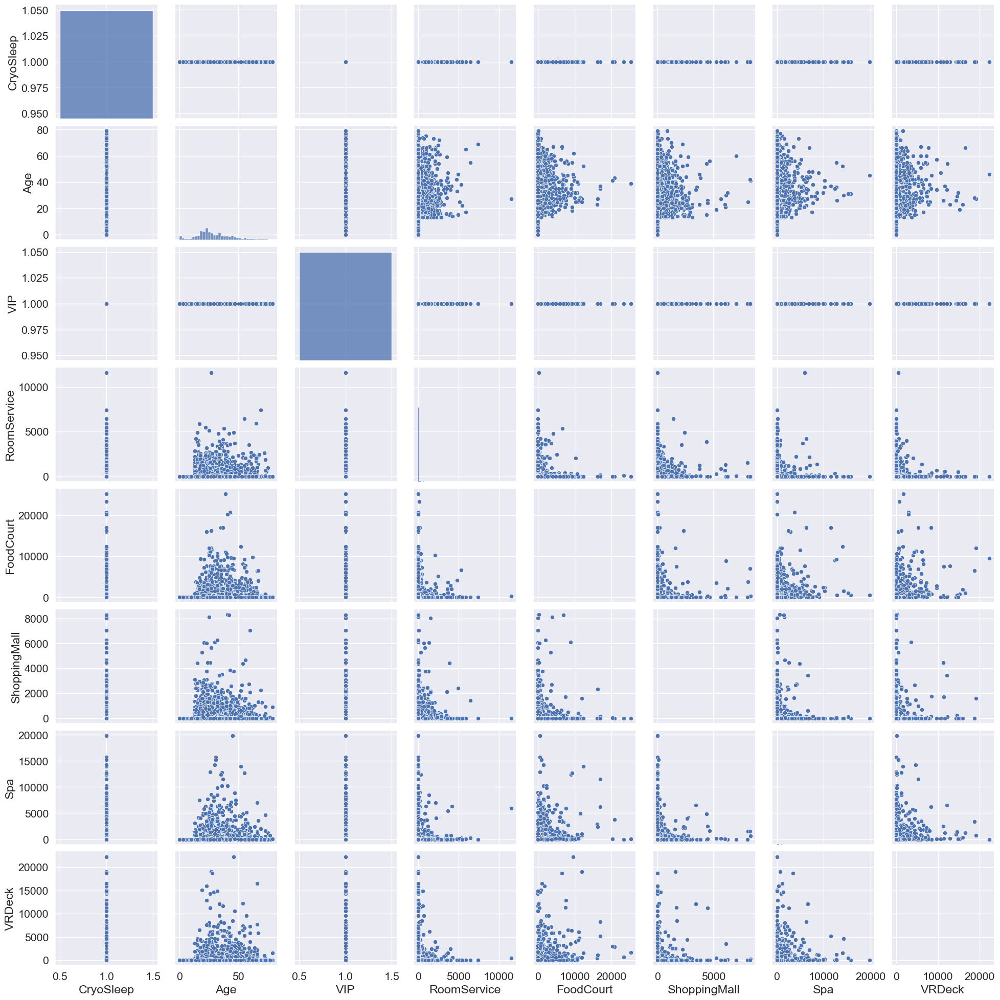

In [42]:
pairplot(test)

<b><span style='color:#DEB078'>1.13 |</span><span style='color:#660000'>Plotting All Categorial with Target
    </span></b>  


In [169]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.CryoSleep))
fig = go.Figure(data=traces, layout=go.Layout(
        title=go.layout.Title(text=f"CryoSleep X Transported")))
iplot(fig)

<b><span style='color:#DEB078'>1.14 |</span><span style='color:#660000'>Plotting All Categorial with Target 
    </span></b>  


In [168]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.VIP,))
fig = go.Figure(data=traces,layout=dict({'title':'VIP X Transported'}))
fig.show()

In [167]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.HomePlanet,))
fig = go.Figure(data=traces,layout=dict({'title':'HomePlanet X Transported'}))
fig.show()

In [170]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.Destination,))
fig = go.Figure(data=traces,layout=dict({'title':'Destination X Transported'}))
fig.show()

In [178]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j['Last Name']))
fig = go.Figure(data=traces,layout=dict({'title':'Last Name X Transported'}))
fig.show()

In [179]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.Deck))
fig = go.Figure(data=traces,layout=dict({'title':'Deck X Transported'}))
fig.show()

In [180]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

traces=[]
for i,j in train.groupby('Transported') :
    traces.append(go.Histogram(name=i, x=j.Side))
fig = go.Figure(data=traces,layout=dict({'title':'Side X Transported'}))
fig.show()

In [171]:
train

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Deck,Num,Side,Last Name
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,B,0,P,Ofracculy
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,F,0,S,Vines
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,A,0,S,Susent
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False,A,0,S,Susent
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True,F,1,S,Santantines
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False,A,98,P,Noxnuther
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False,G,1499,S,Mondalley
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True,G,1500,S,Connon
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False,E,608,S,Hontichre


<b><span style='color:#DEB078'>2.1 |</span><span style='color:#660000'>Filling Missing Value 
    </span></b>  


In [246]:
# Helping Function
def stats(x):
    temp1=(train[[x,'Transported']].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,'Transported']
    df6=pd.merge(train.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'), 
                 train.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,'Transported','Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,'Transported'])
    return temp3.pivot_table(columns=x,index='Transported',margins=True,aggfunc='sum')

In [247]:
stats('CryoSleep')

Category_Percent                 Overall_Percent             
CryoSleep              False    True     All           False  True    All
Transported                                                              
False                  67.11   18.24   85.35            43.1   6.5   49.6
True                   32.89   81.76  114.65            21.1  29.3   50.4
All                   100.00  100.00  200.00            64.2  35.8  100.0

In [248]:
stats('Deck')

Category_Percent                                                  \
Deck                       A       B       C       D       E       F       G   
Transported                                                                    
False                  50.39   26.57   31.99   56.69   64.27   56.01   48.38   
True                   49.61   73.43   68.01   43.31   35.73   43.99   51.62   
All                   100.00  100.00  100.00  100.00  100.00  100.00  100.00   

                                   Overall_Percent                             \
Deck             T Missing     All               A    B    C    D     E     F   
Transported                                                                     
False         80.0   49.75  464.05             1.5  2.4  2.7  3.1   6.5  18.0   
True          20.0   50.25  435.95             1.5  6.6  5.8  2.4   3.6  14.1   
All          100.0  100.00  900.00             3.0  9.0  8.5  5.5  10.1  32.1   

                                      
Deck            G    T Missing   All  
Transported                           
False        14.2  0.0     1.1  49.5  
True         15.2  0.0     1.2  50.4  
All          29.4  0.0     2.3  99.9

In [249]:
stats('Side')

Category_Percent                        Overall_Percent        \
Side                 Missing       P      S     All         Missing     P   
Transported                                                                 
False                  49.75   54.87   44.5  149.12             1.1  26.6   
True                   50.25   45.13   55.5  150.88             1.2  21.8   
All                   100.00  100.00  100.0  300.00             2.3  48.4   

                          
Side            S    All  
Transported               
False        21.9   49.6  
True         27.4   50.4  
All          49.3  100.0

In [259]:
def point_plot(data) :
    p=train.select_dtypes(include='number').columns.to_list()
    if len(p)%4 != 0 :
        length = len(p)//4 +1
    else :
        length=len(p)/4
    plt.subplots(length,4,figsize=(12,8))
    count=1
    for i in p :
        if count<=len(p) :
            plt.subplot(length,4,count)
            sns.pointplot(x=data['Transported'],y=data[i],color='#660000')
            count+=1
        else :
            break
    plt.tight_layout()    
    plt.show()
    
    

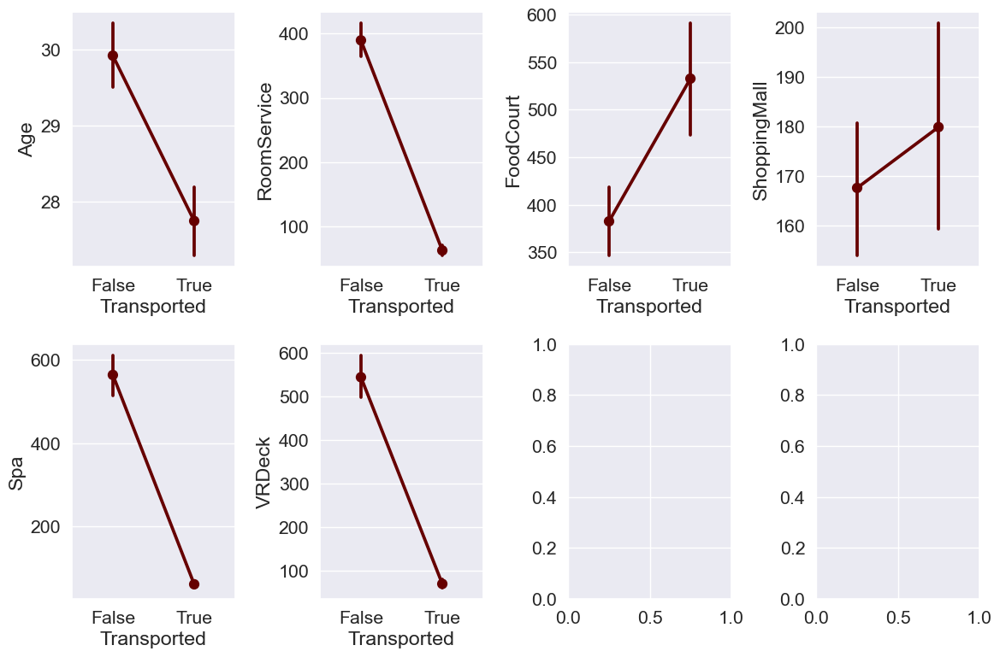

In [260]:
point_plot(train)

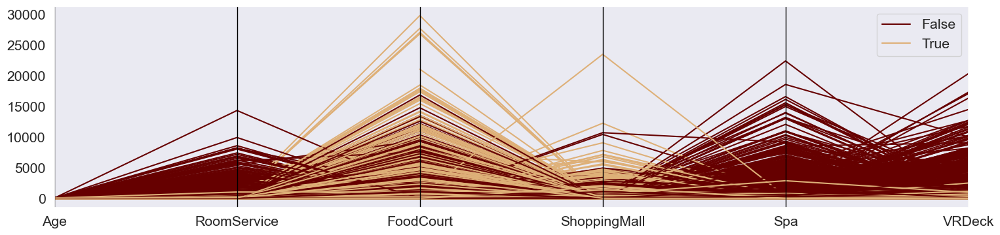

In [261]:
p=train.select_dtypes(include='number').columns.to_list()
p.append("Transported")
#p.remove("PassengerId_GroupId")
#p.remove('Age')
plt.figure(figsize=(18,4)) 
pd.plotting.parallel_coordinates(train[p], "Transported",color=('#660000','#DEB078'))
plt.show()

In [262]:
fig = px.imshow(train.corr().round(2),zmin=-1,zmax=1, text_auto=True,width=1200,height=650,aspect=None,color_continuous_scale=['#660000','#DEB078'])
fig.show()


In [263]:
visualizeNull(train)

<Figure size 1200x800 with 0 Axes>

In [264]:
visualizeNull(test)

<Figure size 1200x800 with 0 Axes>

In [310]:
def fillna(data) :
    num=data.select_dtypes(include='number').columns
    num=num.drop('Age')
    for i in num :
        data[i]=data[i].fillna(0)
    data['HomePlanet']=data.groupby('Last Name')['HomePlanet'].apply(lambda x:x.fillna(returning(x)))
    data['CryoSleep']=data['CryoSleep'].fillna('Missing')
    data['Destination']=data['Destination'].fillna('Missing')
    data['VIP']=data['VIP'].fillna('Missing')
    data['Age']=data['Age'].fillna(data['Age'].median())
    return data
    

In [311]:
test=fillna(test)
train=fillna(train)

<b><span style='color:#DEB078'>3.1 |</span><span style='color:#660000'>Feature Enginering
    </span></b>  


In [327]:
def featEng(data) :
    data['totalSpent']=data[['ShoppingMall','VRDeck','Spa','FoodCourt','RoomService']].sum(axis=1)
    return data

In [331]:
train=featEng(train)
test=featEng(test)

In [332]:
train

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported,Deck,Num,Side,Last Name,totalSpent
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.0,False,0.0,0.0,0.0,0.0,0.0,Maham Ofracculy,False,B,0,P,Ofracculy,0.0
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.0,False,109.0,9.0,25.0,549.0,44.0,Juanna Vines,True,F,0,S,Vines,736.0
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.0,True,43.0,3576.0,0.0,6715.0,49.0,Altark Susent,False,A,0,S,Susent,10383.0
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.0,False,0.0,1283.0,371.0,3329.0,193.0,Solam Susent,False,A,0,S,Susent,5176.0
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.0,False,303.0,70.0,151.0,565.0,2.0,Willy Santantines,True,F,1,S,Santantines,1091.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8688,9276_01,Europa,False,A/98/P,55 Cancri e,41.0,True,0.0,6819.0,0.0,1643.0,74.0,Gravior Noxnuther,False,A,98,P,Noxnuther,8536.0
8689,9278_01,Earth,True,G/1499/S,PSO J318.5-22,18.0,False,0.0,0.0,0.0,0.0,0.0,Kurta Mondalley,False,G,1499,S,Mondalley,0.0
8690,9279_01,Earth,False,G/1500/S,TRAPPIST-1e,26.0,False,0.0,0.0,1872.0,1.0,0.0,Fayey Connon,True,G,1500,S,Connon,1873.0
8691,9280_01,Europa,False,E/608/S,55 Cancri e,32.0,False,0.0,1049.0,0.0,353.0,3235.0,Celeon Hontichre,False,E,608,S,Hontichre,4637.0


<AxesSubplot: xlabel='Transported', ylabel='totalSpent'>

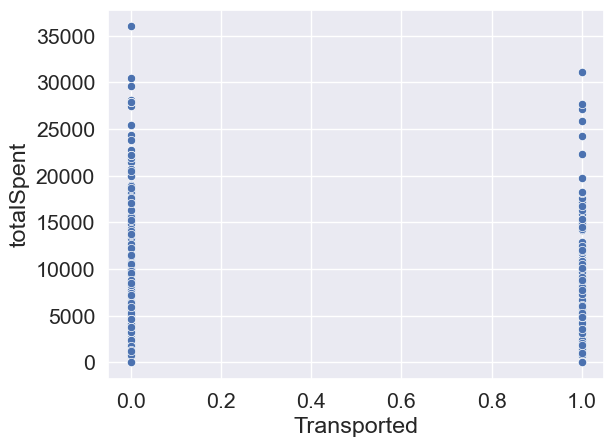

In [336]:
sns.scatterplot(x=train['Transported'],y=train['totalSpent'])

In [333]:
train.to_csv('trainrevisi.csv')

In [334]:
test.to_csv('testrevisi.csv')

In [292]:
def returning(x):
    if x.isnull().values.all() :
        return ('Missing')
    else :
        return x.mode()[0]

In [337]:
fig = px.imshow(train.corr().round(2),zmin=-1,zmax=1, text_auto=True,width=1200,height=650,aspect=None,color_continuous_scale=['#660000','#DEB078'])
fig.show()


<b><span style='color:#DEB078'>4.1 |</span><span style='color:#660000'>Modelling
    </span></b>  


In [342]:
def label_encoder(df):
    columns = ["HomePlanet", "CryoSleep","Deck","Side", "Destination" ,"VIP"]
    for col in columns:
        df[col] = df[col].astype(str)
        df[col] =  LabelEncoder().fit_transform(df[col])
    return df

In [343]:
train2=label_encoder(train)

In [344]:
testid=test['PassengerId']

In [417]:
testid.to_csv('testid.csv',index=False)

In [419]:
test=test.drop('PassengerId',axis=1)

In [423]:
test=test.drop(['Cabin','Name','Last Name','Num'],axis=1)

In [425]:
test=label_encoder(test)

In [435]:
test=scaler.fit_transform(test)

In [345]:
X=train2.drop(['Cabin','Name','Last Name','Num','PassengerId','Transported'],axis=1)
y=train['Transported']

In [351]:
X_train , X_test , Y_train , Y_test = train_test_split(X , y, random_state = 5 ,test_size =0.20)

In [352]:
from sklearn.preprocessing import MinMaxScaler

In [353]:
scaler=MinMaxScaler()

In [354]:
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.fit_transform(X_test)

In [361]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True,
                     custom_metric=None,
                     predictions=False,
                     random_state=12,
                     classifiers='all')

In [362]:
models, predictions = clf.fit(X_train , X_test , Y_train , Y_test)

100%|██████████| 29/29 [00:08<00:00,  3.44it/s]


In [412]:
predictions

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.80,0.80,0.80,0.80,0.08
RandomForestClassifier,0.80,0.80,0.80,0.80,0.62
ExtraTreesClassifier,0.79,0.79,0.79,0.79,0.45
XGBClassifier,0.79,0.79,0.79,0.79,0.17
SVC,0.79,0.79,0.79,0.79,1.15
AdaBoostClassifier,0.78,0.79,0.79,0.78,0.20
NuSVC,0.78,0.78,0.78,0.78,1.51
BaggingClassifier,0.78,0.78,0.78,0.78,0.18
CalibratedClassifierCV,0.78,0.78,0.78,0.78,0.84


In [413]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier( random_state=5)
lgbm.fit(X_train, Y_train)
y_pred = lgbm.predict(X_test)

In [365]:
from flaml import AutoML

In [380]:
auto_ml = AutoML()

In [381]:
auto_ml_settings = {
"time_budget":300, #in seconds
"task":"classification"
}

In [382]:
auto_ml.fit(X_train=X_train_scaled, y_train=Y_train, **auto_ml_settings)

[flaml.automl.automl: 01-29 04:50:07] {2715} INFO - task = classification
[flaml.automl.automl: 01-29 04:50:07] {2717} INFO - Data split method: stratified
[flaml.automl.automl: 01-29 04:50:07] {2720} INFO - Evaluation method: cv
[flaml.automl.automl: 01-29 04:50:07] {2847} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl.automl: 01-29 04:50:07] {2993} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'catboost', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl.automl: 01-29 04:50:07] {3322} INFO - iteration 0, current learner lgbm
[flaml.automl.automl: 01-29 04:50:07] {3460} INFO - Estimated sufficient time budget=379s. Estimated necessary time budget=9s.
[flaml.automl.automl: 01-29 04:50:07] {3507} INFO -  at 0.0s,	estimator lgbm's best error=0.1834,	best estimator lgbm's best error=0.1834
[flaml.automl.automl: 01-29 04:50:07] {3322} INFO - iteration 1, current learner lgbm
[flaml.automl.automl: 01-29 04:50:07] {3507} INFO -  at 0.1s,	estimator lgbm's be

Lets see if there are any relation between some feature

In [433]:
print(auto_ml.model.estimator)

In [ ]:
sns.barplot(data=train,x='CryoSleep',y='FoodCourt')

In [402]:
auto_ml.model.estimator.save_model('saveestimator')

In [403]:
from sklearn.metrics import roc_auc_score

In [434]:
roc_auc_score(Y_test, auto_ml.predict(X_test_scaled), multi_class='ovr')

0.7825085978835978

In [438]:
y_pred = lgbm.predict(test)

In [437]:
auto_ml_predict=auto_ml.predict(test)

In [439]:
auto_ml_p=pd.Series(auto_ml_predict)

In [440]:
catBoost=pd.Series(y_pred)

In [446]:
final_autoML=pd.DataFrame(pd.concat([testid,auto_ml_p],axis=1))

In [449]:
final_autoML=final_autoML.rename(columns={0:'Transported'})

In [450]:
final_autoCat=pd.DataFrame(pd.concat([testid,catBoost],axis=1))
final_autoCat=final_autoCat.rename(columns={0:'Transported'})

In [454]:
final_autoML.to_csv('submission_autoML.csv',index=False)

In [455]:
final_autoCat.to_csv('submission_autoCat.csv',index=False)